## Annotation of Mononuclear Phagocyte subset

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import rcParams

# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3               
sc.logging.print_version_and_date()

# making sure plots & clusters are reproducible
np.random.seed(42)

# custom functions
import ma_codes as codes
from ma_codes import mysize, mymap, gray_red

Running Scanpy 1.6.1.dev110+gb4234d81, on 2021-02-25 12:24.


In [2]:
## path variables
adata_path = 'mnt/smb2/Niklas/GLPG_data_temp/subsets/210211_mnp_subset_NIKLAS.h5ad'

In [3]:
## plotting variables
sc.settings.figdir = '/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/mnp_subset'
sc.set_figure_params(vector_friendly = True)
plt.rcParams['figure.figsize'] = (6, 5)
plt.rcParams['pdf.fonttype'] = 42

In [4]:
## load anndata object
adata = sc.read(adata_path)

In [5]:
## have a look at the adata object
adata

AnnData object with n_obs × n_vars = 144612 × 25194
    obs: 'identifier', 'time_point', 'n_counts', 'preprocessing_cluster', 'size_factors', 'S_score', 'G2M_score', 'phase', 'treatment_time', 'treatment', 'sample_name', 'condition', 'percent_mito', 'cluster_03', 'GLPG_annotation', 'doublet_scores', 'n_genes', 'louvain_1', 'louvain_2'
    var: 'means', 'dispersions', 'dispersions_norm', 'n_cells', 'n_counts', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'GLPG_annotation_colors', 'cluster_03_colors', 'condition_colors', 'hvg', 'identifier_colors', 'louvain', 'louvain_1_colors', 'neighbors', 'pca', 'time_point_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'unsouped_counts'
    obsp: 'connectivities', 'distances'

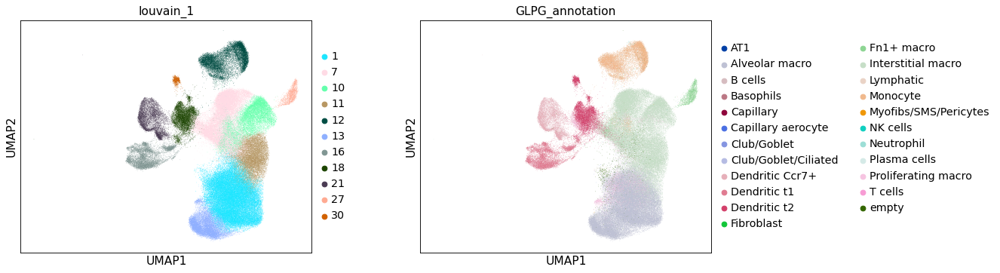

In [6]:
## overview plot
sc.pl.umap(adata, color = ['louvain_1', 'GLPG_annotation'], wspace = .25)

### Remove outliers with DBscan

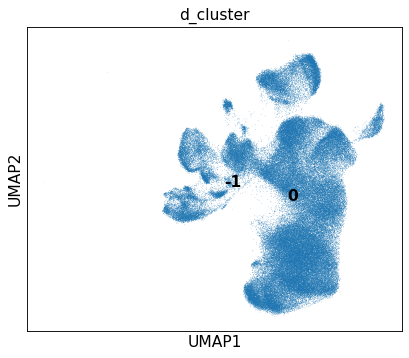

In [7]:
## using Herbert's old code snippet here
from natsort import natsorted
from sklearn.cluster import DBSCAN
def cluster_by_dscan(cords, eps, min_samples):
    clustering = DBSCAN(eps = eps, min_samples = min_samples).fit(cords)
    return clustering.labels_

adata.obs['d_cluster'] = cluster_by_dscan(adata.obsm['X_umap'], eps = 0.5, min_samples = 5)
c = adata.obs['d_cluster'].astype("U")
adata.obs['d_cluster'] = pd.Categorical(c, categories = natsorted(np.unique(c)))

sc.pl.umap(adata, color = 'd_cluster', legend_loc='on data')

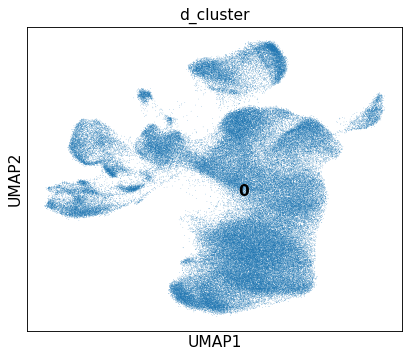

In [8]:
## discard outliers
adata = adata[adata.obs['d_cluster'].isin(['0'])].copy()
sc.pl.umap(adata, color = 'd_cluster', legend_loc='on data')

### Calculate HVGs

In [9]:
## delete all obs colums related to highly variable genes
del(adata.var['highly_variable'])
del(adata.var['highly_variable_nbatches'])
del(adata.var['highly_variable_intersection'])

In [10]:
## filter genes
sc.pp.filter_genes(adata, min_counts = 1)
sc.pp.filter_genes(adata, min_cells = 10)

filtered out 1082 genes that are detected in less than 1 counts
filtered out 2002 genes that are detected in less than 10 cells


extracting highly variable genes
/home/agando/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
    finished (0:00:45)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
/home/agando/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


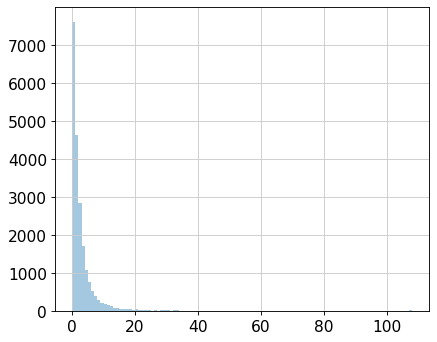

In [11]:
## compute HVGs per batch ('identifier') using seurat method
batch = 'identifier'
sc.pp.highly_variable_genes(adata, min_disp = None, max_disp = None, min_mean = None, max_mean = None, 
                                batch_key = batch, n_top_genes = 1000, n_bins = 20, flavor = 'seurat', 
                                subset = False)
vartab = pd.DataFrame(adata.var['highly_variable_nbatches'], index = adata.var_names)
sb.distplot(vartab, kde = False, bins = len(np.unique(adata.obs[batch])))

In [12]:
## only consider a gene as variable if variable in at least 7 batches
thresh = 7
hvgs = vartab[vartab.highly_variable_nbatches.values >= thresh].index
print('%s Genes kept, variable in at least %s samples' %(len(hvgs), thresh))

2916 Genes kept, variable in at least 7 samples


In [ ]:
## far fewer than expected...

In [13]:
## remove cell cycle genes (MOUSE) from list of HVGs
cc_genes = [x.strip().capitalize() for x in open('/home/agando/Documents/Meshal/PhD_Scripts/' +
                                                 'for_orientation/regev_lab_cell_cycle_genes.txt')]
hvgs = np.setdiff1d(hvgs, cc_genes)

In [14]:
## set HVGs
adata.var['highly_variable'] = [g in hvgs for g in adata.var_names]
## no. of resulting HVGs
sum(adata.var['highly_variable'])

2869

In [15]:
## check if Malat1 in HVGs
adata.var['highly_variable']['Malat1']

False

### PCA

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:20)


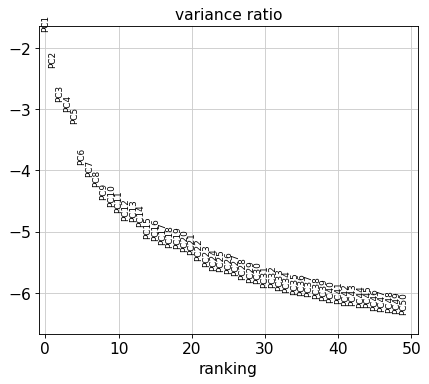

In [16]:
## PCA
sc.pp.pca(adata, use_highly_variable = True)
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

### kNN graph

In [17]:
sc.pp.neighbors(adata, n_pcs = 50, n_neighbors = 30) # without batch correction

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:15)


### Graph-based clustering and Visualization

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 33 clusters and added
    'sub_louvain', the cluster labels (adata.obs, categorical) (0:01:22)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:38)


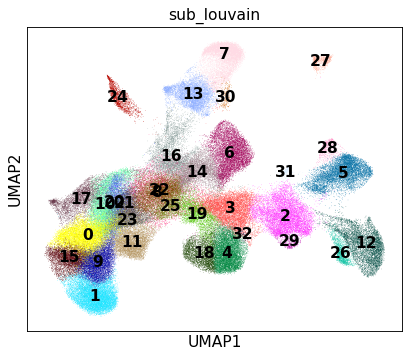

In [18]:
sc.tl.louvain(adata, resolution = 2.4, key_added = 'sub_louvain')
sc.tl.umap(adata)
sc.pl.umap(adata, color = ['sub_louvain'], legend_loc = 'on data')

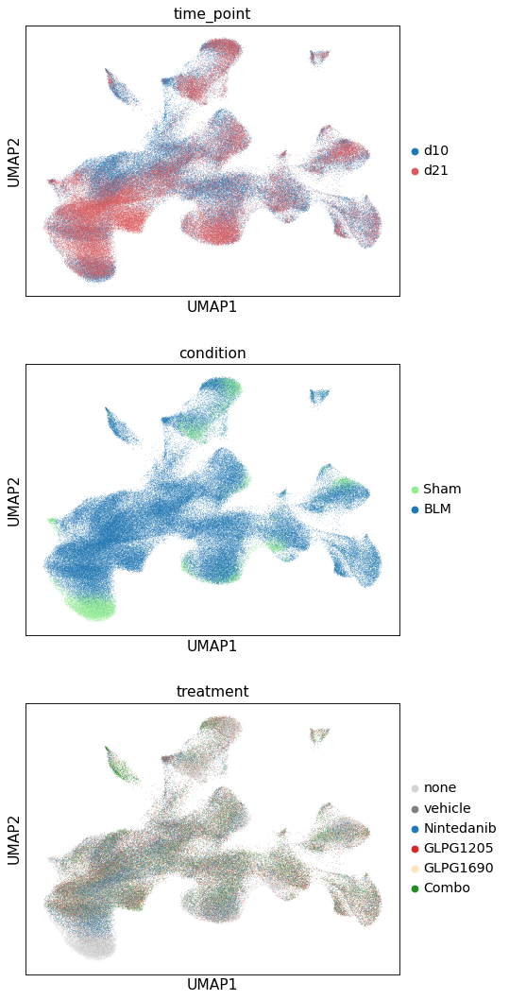

In [19]:
sc.pl.umap(adata, color = ['time_point', 'condition', 'treatment'], ncols = 1)

### Plot QC metrics

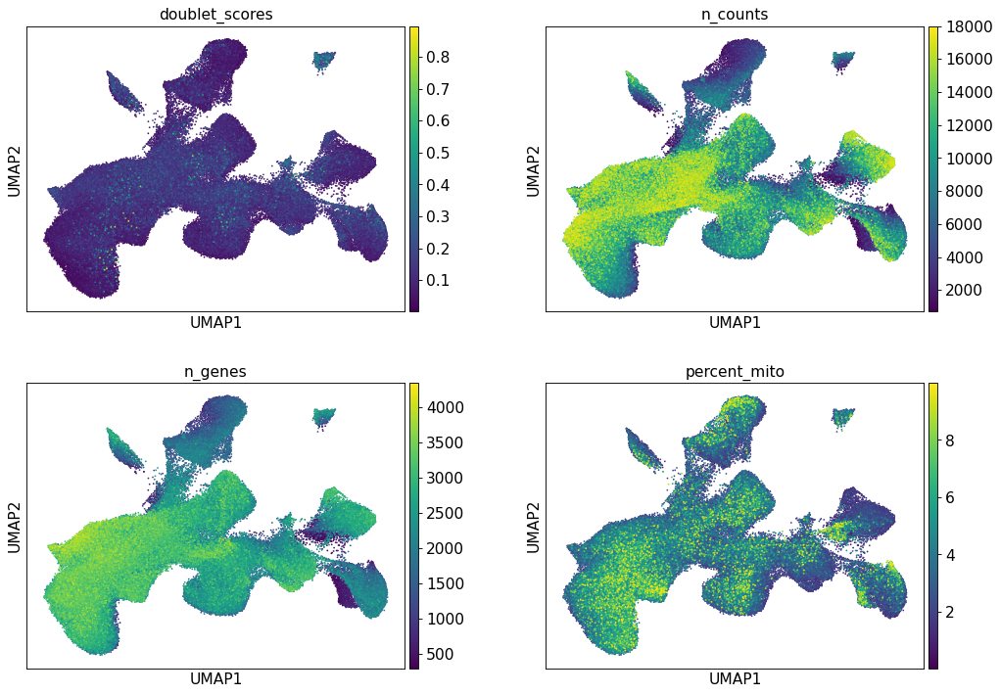

In [20]:
sc.pl.umap(adata, color = ['doublet_scores', 'n_counts', 'n_genes', 'percent_mito'], ncols = 2, wspace = 0.25, size = 10)

### Plot marker genes

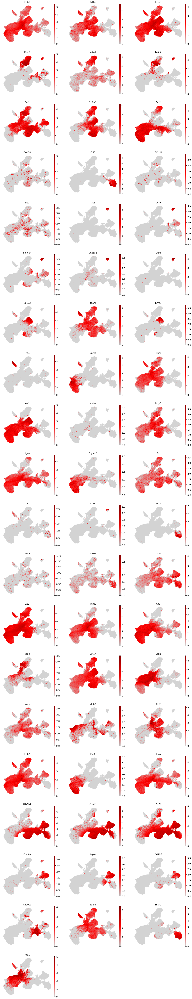

In [21]:
sc.pl.umap(adata, color = ['Cd68', #Monocyte/Macrophage lineage marker
                              'Cd14', 'Fcgr3', 'Plac8', 'Nr4a1', # monocytes
                              'Ly6c2', "Ccr2", # classical monocytes
                              'Cx3cr1', "Ear2", # non-classical monocytes
                              'Cxcl10','Ccl5','Ifit1bl1','Ifit2', # differentiating  monocytes
                              'Klk1','Ccr9','Siglech','Cox6a2','Ly6d', #CD11c+/CD11b- monocytes
                              'Cd163', 'Itgam', 'Lyve1', 'Prg4', # interstitial Macrophages
                              'Marco', 'Msr1', 'Mrc1', 'Inhba', 'Fcgr1', 'Itgax', 'Siglecf', # AM
                              'Tnf', 'Il6', 'Il12a', 'Il12b', 'Il23a', 'Cd80', 'Cd86', 'Lyz2', # inflammatory Macrophages
                              'Trem2', 'Cd9', 'Vcan', 'Csf1r', 'Spp1', 'Matk', # inflammatory Macrophages
                              'Mki67', # proliferation
                              'Ccl2', 'Itgb2', 'Ear1',
                              'Itgax', 'H2-Eb1', 'H2-Ab1', 'Cd74', #DCs
                              'Clec9a', 'Itgae', 'Cd207', # CD103+ DCs
                              'Cd209a', 'Itgam', # CD11b+ cDCs
                              'Fscn1', # Fscn1+ DCs
                              'Arg1'], ncols=3, size=20, frameon = False,
           color_map=gray_red)

### Compute marker genes

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:06:32)


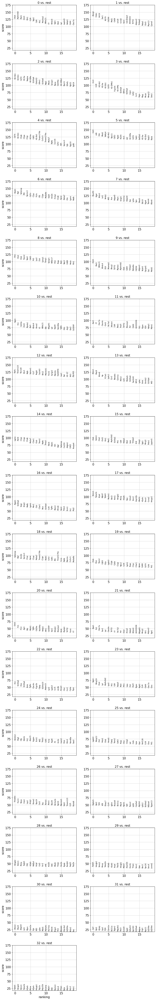

In [22]:
sc.tl.rank_genes_groups(adata, groupby = 'sub_louvain', groups = 'all', use_raw = True, method = 'wilcoxon', 
                        n_genes=100)
sc.pl.rank_genes_groups(adata, ncols = 2)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_sub_louvain']`


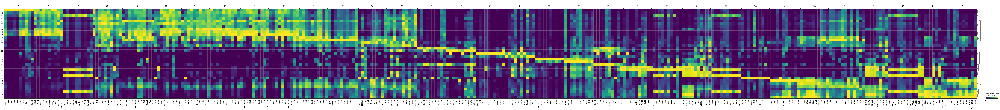

In [23]:
## find markers
sc.tl.dendrogram(adata, groupby = 'sub_louvain')
#sc.tl.rank_genes_groups(adata, groupby = 'sub_louvain', method = 'wilcoxon')
sc.pl.rank_genes_groups_matrixplot(adata, n_genes = 10, standard_scale = 'var')

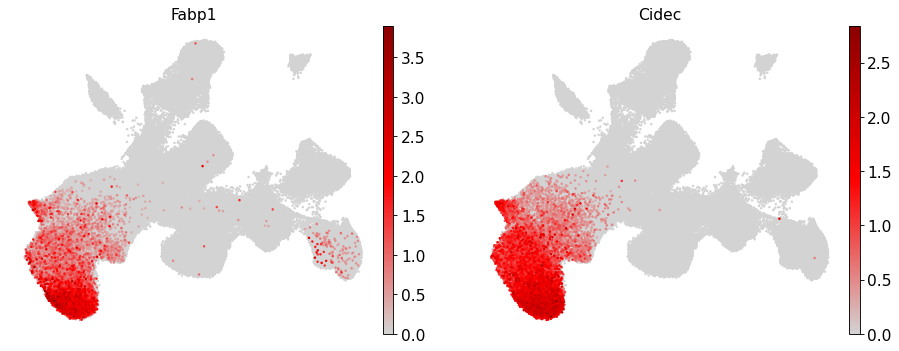

In [24]:
## marker of AM subsets
sc.pl.umap(adata, color = ['Fabp1','Cidec'], ncols=3, size=20, frameon = False,
           color_map=gray_red)

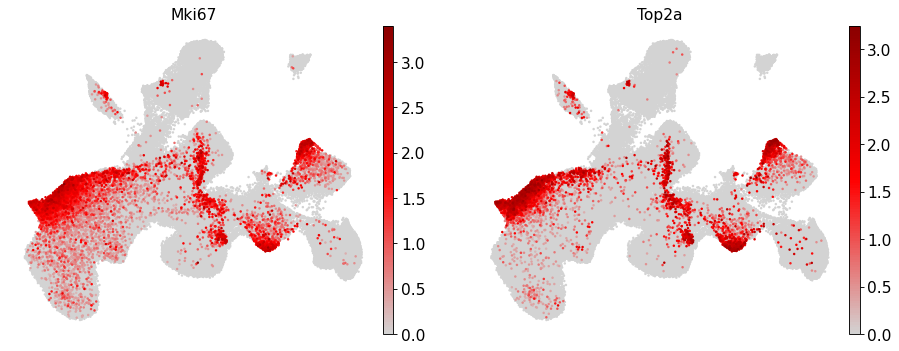

In [25]:
## proliferation markers
sc.pl.umap(adata, color = ['Mki67','Top2a'], ncols=3, size=20, frameon = False,
           color_map=gray_red)

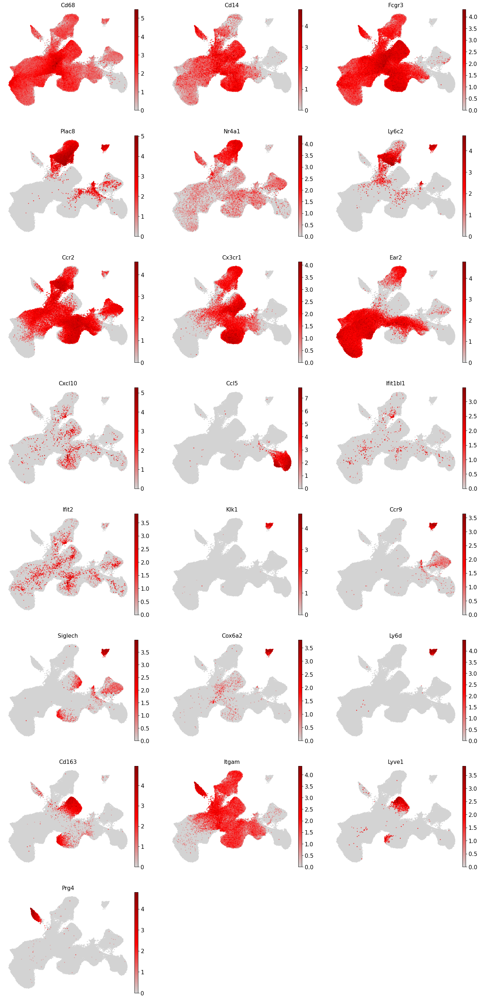

In [26]:
## monocyte subset marker
sc.pl.umap(adata, color = ['Cd68', #Monocyte/Macrophage lineage marker
                              'Cd14', 'Fcgr3', 'Plac8', 'Nr4a1', # monocytes
                              'Ly6c2', "Ccr2", # classical monocytes
                              'Cx3cr1', "Ear2", # non-classical monocytes
                              'Cxcl10','Ccl5','Ifit1bl1','Ifit2', # differentiating  monocytes
                              'Klk1','Ccr9','Siglech','Cox6a2','Ly6d', #CD11c+/CD11b- monocytes
                              'Cd163', 'Itgam', 'Lyve1', 'Prg4', # interstitial Macrophages
                              ], ncols=3, size=20, frameon = False,
           color_map=gray_red)

### Cluster Annotation

... storing 'cell_type' as categorical


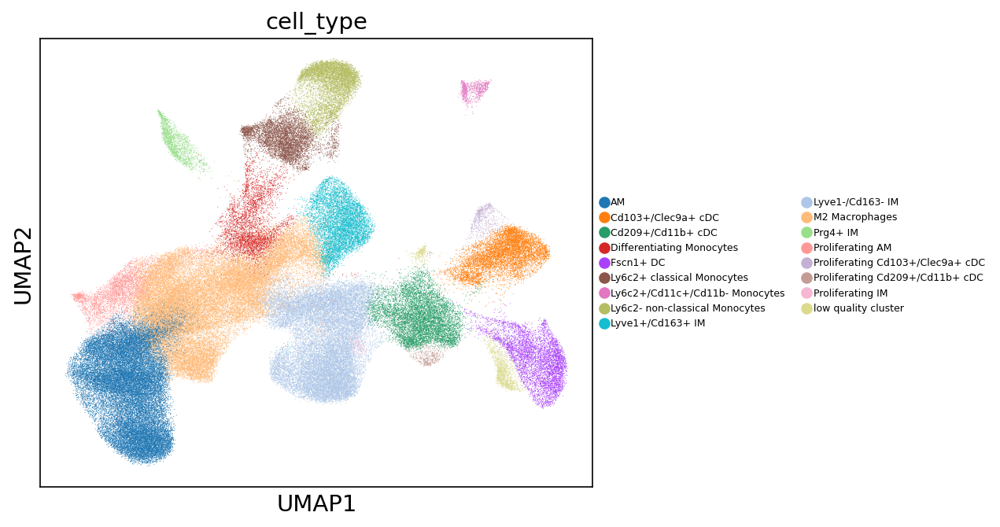

In [27]:
cell_type = {'0' : 'AM',
             '1' : 'AM',
             '2' : 'Cd209+/Cd11b+ cDC',
             '3' : 'Lyve1-/Cd163- IM',
             '4' : 'Lyve1-/Cd163- IM',
             '5' : 'Cd103+/Clec9a+ cDC',
             '6' : 'Lyve1+/Cd163+ IM',
             '7' : 'Ly6c2- non-classical Monocytes',
             '8' : 'M2 Macrophages',
             '9' : 'AM',
             '10' : 'M2 Macrophages',
             '11' : 'M2 Macrophages',
             '12' : 'Fscn1+ DC',
             '13' : 'Ly6c2+ classical Monocytes',
             '14' : 'M2 Macrophages',
             '15' : 'AM',
             '16' : 'Differentiating Monocytes', 
             '17' : 'Proliferating AM',
             '18' : 'Lyve1-/Cd163- IM', 
             '19' : 'Lyve1-/Cd163- IM',
             '20' : 'M2 Macrophages',
             '21' : 'M2 Macrophages',
             '22' : 'M2 Macrophages', 
             '23' : 'M2 Macrophages',
             '24' : 'Prg4+ IM', #Emilin2 und Ecm1 positive
             '25' : 'M2 Macrophages',
             '26' : 'low quality cluster',
             '27' : 'Ly6c2+/Cd11c+/Cd11b- Monocytes', 
             '28' : 'Proliferating Cd103+/Clec9a+ cDC',
             '29' : 'Proliferating Cd209+/Cd11b+ cDC',
             '30' : 'Ly6c2+ classical Monocytes', 
             '31' : 'low quality cluster', ## low quality cluster
             '32' : 'Proliferating IM'
            }

adata.obs['cell_type'] = [cell_type[cluster] for cluster in adata.obs['sub_louvain']]
sc.pl.umap(adata, color = 'cell_type', ax = mysize(6, 5, 150), legend_fontsize = 6)

### Remove low-quality cells and re-calculate UMAP

In [28]:
## remove low quality clusters
adata = adata[-adata.obs.cell_type.isin(['low quality cluster'])].copy()

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:35)


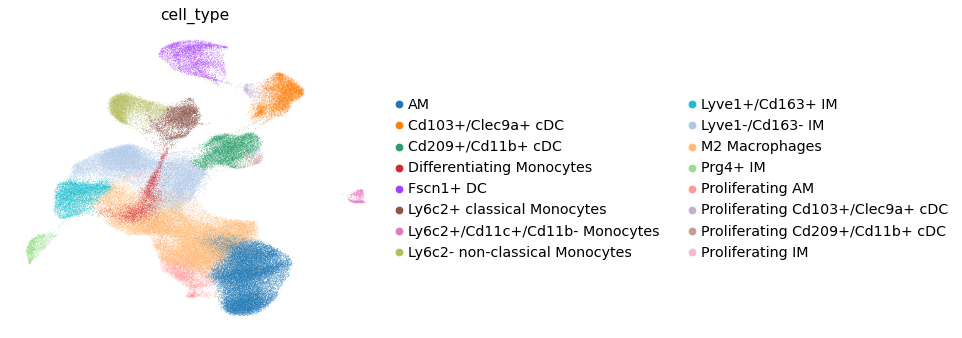

In [29]:
## UMAP
sc.tl.umap(adata)
sc.pl.umap(adata, color = ['cell_type'], frameon = False)

### Re-calculate markers (of final annotated cell type clusters)

In [30]:
## All Markers
sc.tl.rank_genes_groups(adata, groupby = 'cell_type', n_genes = 500, groups = 'all',
                        use_raw = True, method = 'wilcoxon')

## Combine into one Data Frame (comparable to Marker Table)
result = adata.uns['rank_genes_groups']
allMarkers = []
for cluster in result['names'].dtype.names:
    current = pd.DataFrame({'gene': result['names'][cluster], 'score': result['scores'][cluster],
                            'logfoldchange': result['logfoldchanges'][cluster], 'pval': result['pvals'][cluster],
                            'pval_adj': result['pvals_adj'][cluster], 'cell_type': cluster})
    allMarkers.append(current)
allMarkers = pd.concat(allMarkers)
allMarkers.head()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:05:34)


,gene,score,logfoldchange,pval,pval_adj,cell_type
0,Plet1,228.059631,4.199381,0.0,0.0,AM
1,Chil3,225.710205,5.522272,0.0,0.0,AM
2,Abcg1,215.928787,3.304545,0.0,0.0,AM
3,Atp6v0d2,201.854797,3.078597,0.0,0.0,AM
4,Cd164,199.281570,2.952809,0.0,0.0,AM


In [31]:
## filter
allMarkers = allMarkers[allMarkers.pval_adj < 0.1].copy()
allMarkers.cell_type.value_counts()

M2 Macrophages                      500
Ly6c2- non-classical Monocytes      500
Proliferating AM                    500
Lyve1+/Cd163+ IM                    500
Proliferating Cd103+/Clec9a+ cDC    500
Lyve1-/Cd163- IM                    500
Prg4+ IM                            500
Ly6c2+/Cd11c+/Cd11b- Monocytes      500
Differentiating Monocytes           500
Cd209+/Cd11b+ cDC                   500
AM                                  500
Ly6c2+ classical Monocytes          500
Proliferating IM                    500
Cd103+/Clec9a+ cDC                  500
Proliferating Cd209+/Cd11b+ cDC     500
Fscn1+ DC                           500
Name: cell_type, dtype: int64

In [32]:
## save marker table
out_dir = '/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Data/'
allMarkers.to_csv(out_dir + 'marker_table_GLPG_mnp_subset_NIKLAS.csv', sep = '\t', index = False)

### Summary figures

In [33]:
adata.obs.cell_type.cat.categories

Index(['AM', 'Cd103+/Clec9a+ cDC', 'Cd209+/Cd11b+ cDC',
       'Differentiating Monocytes', 'Fscn1+ DC', 'Ly6c2+ classical Monocytes',
       'Ly6c2+/Cd11c+/Cd11b- Monocytes', 'Ly6c2- non-classical Monocytes',
       'Lyve1+/Cd163+ IM', 'Lyve1-/Cd163- IM', 'M2 Macrophages', 'Prg4+ IM',
       'Proliferating AM', 'Proliferating Cd103+/Clec9a+ cDC',
       'Proliferating Cd209+/Cd11b+ cDC', 'Proliferating IM'],
      dtype='object')

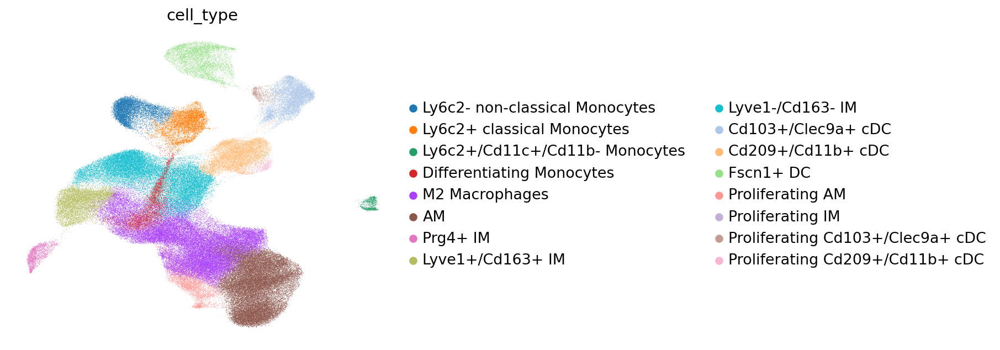

In [34]:
## change order of cell type labels
adata.obs['cell_type'] = adata.obs['cell_type'].cat.reorder_categories(['Ly6c2- non-classical Monocytes',
                                                                        'Ly6c2+ classical Monocytes',
                                                                        'Ly6c2+/Cd11c+/Cd11b- Monocytes',
                                                                        'Differentiating Monocytes',
                                                                        'M2 Macrophages',
                                                                        'AM',
                                                                        'Prg4+ IM',
                                                                        'Lyve1+/Cd163+ IM',
                                                                        'Lyve1-/Cd163- IM',
                                                                        'Cd103+/Clec9a+ cDC', 
                                                                        'Cd209+/Cd11b+ cDC',
                                                                        'Fscn1+ DC',
                                                                        'Proliferating AM',
                                                                        'Proliferating IM', 
                                                                        'Proliferating Cd103+/Clec9a+ cDC',
                                                                        'Proliferating Cd209+/Cd11b+ cDC'
                                                                        ])
sc.pl.umap(adata, color = 'cell_type', ax = mysize(6, 5, 150), frameon = False)

... storing 'cell_type_compact' as categorical


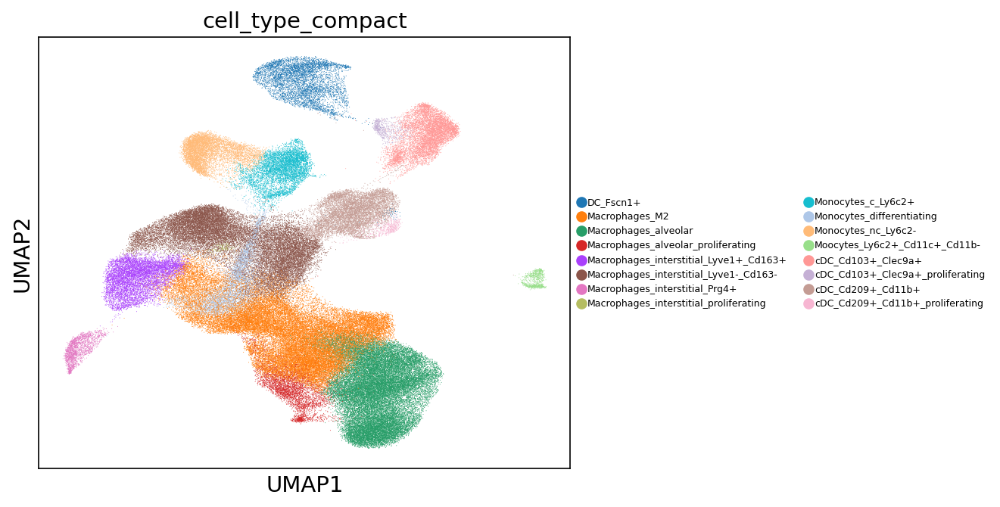

In [35]:
## special regex compatible cell type labels for GLPG :)
cell_type_conversion = {'Ly6c2- non-classical Monocytes' : 'Monocytes_nc_Ly6c2-',
                        'Ly6c2+ classical Monocytes' : 'Monocytes_c_Ly6c2+',
                        'Differentiating Monocytes' : 'Monocytes_differentiating',
                        'Ly6c2+/Cd11c+/Cd11b- Monocytes' : 'Moocytes_Ly6c2+_Cd11c+_Cd11b-',
                        'AM' : 'Macrophages_alveolar',
                        'Proliferating AM' : 'Macrophages_alveolar_proliferating',
                        'M2 Macrophages' : 'Macrophages_M2',
                        'Prg4+ IM' : 'Macrophages_interstitial_Prg4+',
                        'Lyve1+/Cd163+ IM' : 'Macrophages_interstitial_Lyve1+_Cd163+',
                        'Lyve1-/Cd163- IM' : 'Macrophages_interstitial_Lyve1-_Cd163-',
                        'Proliferating IM' : 'Macrophages_interstitial_proliferating',
                        'Cd103+/Clec9a+ cDC' : 'cDC_Cd103+_Clec9a+',
                        'Cd209+/Cd11b+ cDC' : 'cDC_Cd209+_Cd11b+',
                        'Proliferating Cd103+/Clec9a+ cDC' : 'cDC_Cd103+_Clec9a+_proliferating',
                        'Proliferating Cd209+/Cd11b+ cDC' : 'cDC_Cd209+_Cd11b+_proliferating',
                        'Fscn1+ DC' : 'DC_Fscn1+'
}
adata.obs['cell_type_compact'] = [cell_type_conversion[cluster] for cluster in adata.obs['cell_type']]
sc.pl.umap(adata, color = 'cell_type_compact', ax = mysize(6, 5, 150), legend_fontsize = 6)

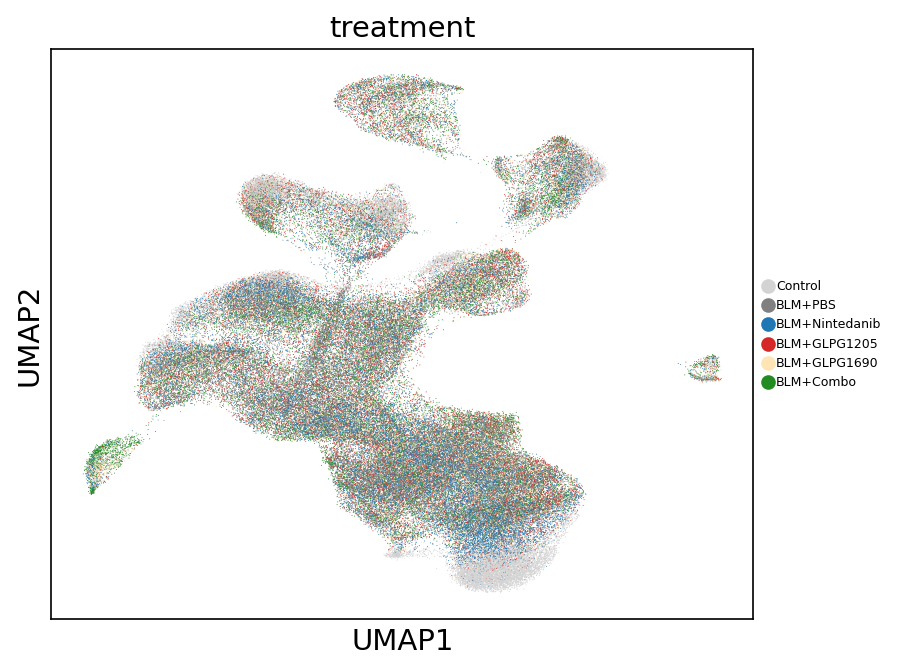

In [36]:
# rename condition label upon request of GLPG :)
treatment_conversion = {'none' : 'Control',
                        'vehicle' : 'BLM+PBS',
                        'Nintedanib' : 'BLM+Nintedanib',
                        'GLPG1205' : 'BLM+GLPG1205',
                        'GLPG1690' : 'BLM+GLPG1690',
                        'Combo' : 'BLM+Combo'
}
adata.obs['treatment'] = [treatment_conversion[t] for t in adata.obs['treatment']]
## reorder condition labels
adata.obs['treatment'] = adata.obs['treatment'].astype('category')
adata.obs['treatment'] = adata.obs['treatment'].cat.reorder_categories(['Control','BLM+PBS',
                                                                        'BLM+Nintedanib',
                                                                        'BLM+GLPG1205',
                                                                        'BLM+GLPG1690',
                                                                        'BLM+Combo'])
## plot UMAPs with new labels
sc.pl.umap(adata, color = 'treatment', ax = mysize(6, 5, 150), legend_fontsize = 6)

... storing 'treatment_time' as categorical


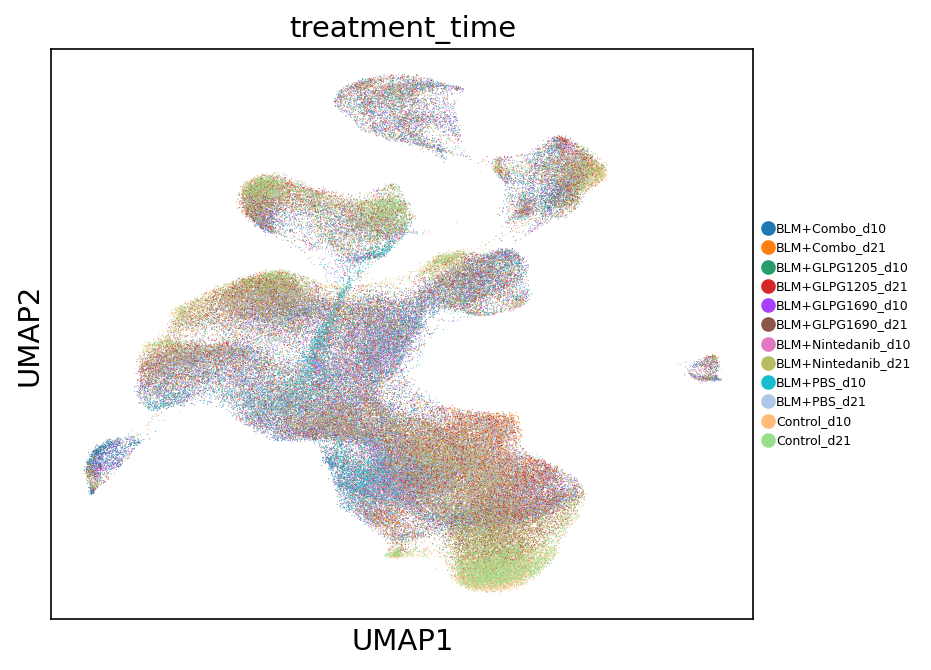

In [37]:
## rename treatment_time label upon request of GLPG :)
treatment_time_conversion = {'none_d10' : 'Control_d10',
                             'none_d21' : 'Control_d21',
                             'vehicle_d10' : 'BLM+PBS_d10',
                             'vehicle_d21' : 'BLM+PBS_d21',
                             'Nintedanib_d10' : 'BLM+Nintedanib_d10',
                             'Nintedanib_d21' : 'BLM+Nintedanib_d21',
                             'GLPG1205_d10' : 'BLM+GLPG1205_d10',
                             'GLPG1205_d21' : 'BLM+GLPG1205_d21',
                             'GLPG1690_d10' : 'BLM+GLPG1690_d10',
                             'GLPG1690_d21' : 'BLM+GLPG1690_d21',
                             'Combo_d10' : 'BLM+Combo_d10',
                             'Combo_d21' : 'BLM+Combo_d21'
}
adata.obs['treatment_time'] = [treatment_time_conversion[tt] for tt in adata.obs['treatment_time']]
sc.pl.umap(adata, color = 'treatment_time', ax = mysize(6, 5, 150), legend_fontsize = 6)

In [38]:
adata.obs.cell_type.cat.categories

Index(['Ly6c2- non-classical Monocytes', 'Ly6c2+ classical Monocytes',
       'Ly6c2+/Cd11c+/Cd11b- Monocytes', 'Differentiating Monocytes',
       'M2 Macrophages', 'AM', 'Prg4+ IM', 'Lyve1+/Cd163+ IM',
       'Lyve1-/Cd163- IM', 'Cd103+/Clec9a+ cDC', 'Cd209+/Cd11b+ cDC',
       'Fscn1+ DC', 'Proliferating AM', 'Proliferating IM',
       'Proliferating Cd103+/Clec9a+ cDC', 'Proliferating Cd209+/Cd11b+ cDC'],
      dtype='object')

In [39]:
## custom colors to highlight differences between cell types
celltype_colours = ['#65209b', # Ly6c2- non-classical Monocytes
                    '#f7b6d2', # Ly6c2+ classical Monocytes
                    '#fc9983', # Ly6c2+/Cd11c+/Cd11b- Monocytes
                    '#d62728', # Differentiating Monocytes
                    '#ff7f0e', # M2 M
                    '#b36bf6', # AM
                    '#bdecf0', # Prg4+ IM
                    '#1e37d4', # Lyve1+/Cd163+ IM
                    '#49de16', # Lyve1-/Cd163- IM
                    '#f1c40f', # Cd103+/Clec9a+ cDC
                    '#bfe9ac', # Cd209+/Cd11b+ cDC
                    '#138310', # Fscn1+ DC
                    '#17becf', # Proliferating AM
                    '#17202a', # Proliferating IM
                    '#4be7b0', # Proliferating Cd103+/Clec9a+ cDC
                    '#bb7784', # Proliferating Cd209+/Cd11b+ cDC
                   ]

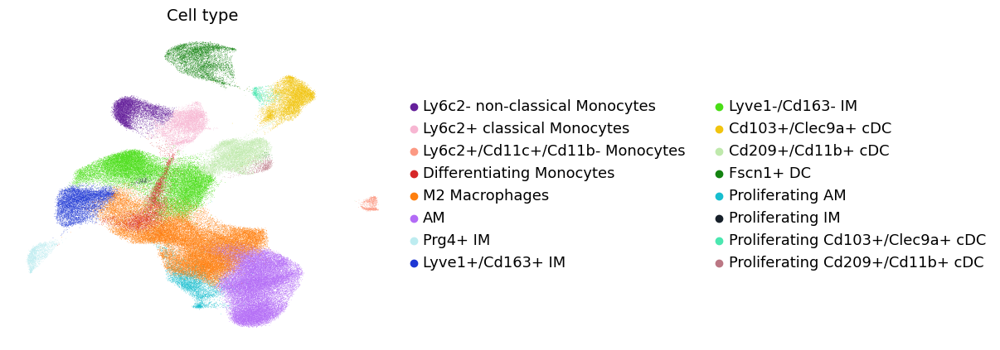

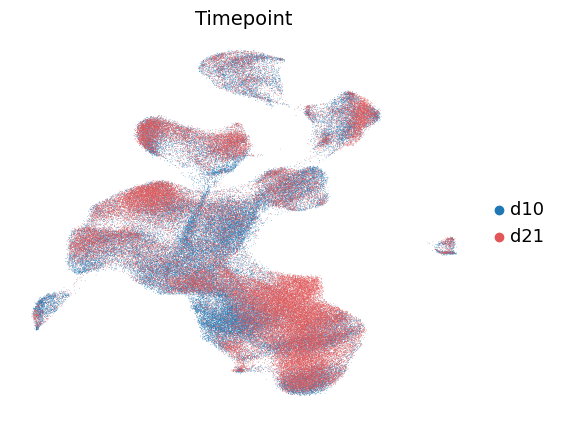

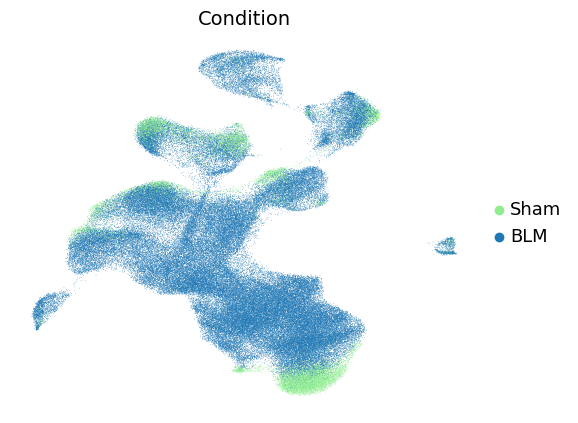

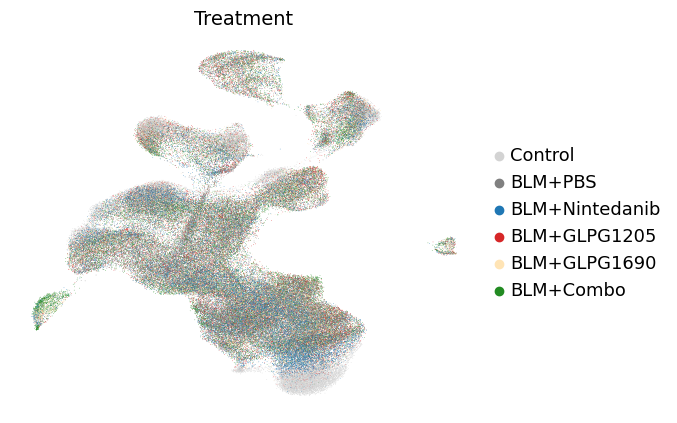

In [40]:
## save UMAP of MNPs for future use
sc.pl.umap(adata, color = ['cell_type'], title = 'Cell type', palette = celltype_colours, frameon = False, 
           ax = mysize(6, 5, 100), save = '_celltype.pdf')
sc.pl.umap(adata, color = ['time_point'], title = 'Timepoint', frameon = False, 
           ax = mysize(6, 5, 100), save = '_timepoint.pdf')
sc.pl.umap(adata, color = ['condition'], title = 'Condition', frameon = False, 
           ax = mysize(6, 5, 100), save = '_condition.pdf')
sc.pl.umap(adata, color = ['treatment'], title = 'Treatment', frameon = False, 
           ax = mysize(6, 5, 100), save = '_treatment.pdf')

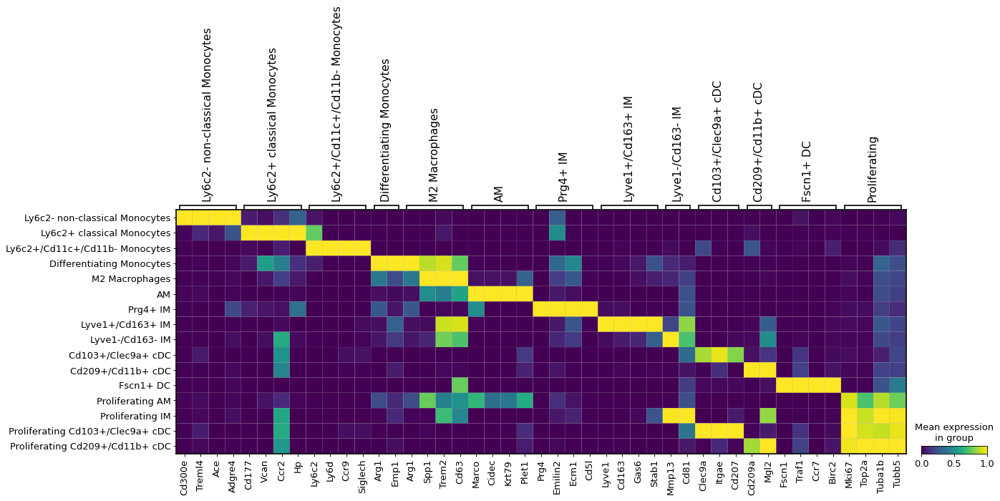

In [41]:
## custom heatmap
# matrixplot with marker genes
celltype_markers={'Ly6c2- non-classical Monocytes' : ['Cd300e','Treml4','Ace','Adgre4'],
                  'Ly6c2+ classical Monocytes' : ['Cd177','Vcan','Ccr2','Hp'],
                  'Ly6c2+/Cd11c+/Cd11b- Monocytes' : ['Ly6c2','Ly6d','Ccr9','Siglech'],
                  'Differentiating Monocytes' : ['Arg1','Emp1'],
                  'M2 Macrophages' : ['Arg1','Spp1','Trem2','Cd63'],
                  'AM' : ['Marco','Cidec','Krt79','Plet1'],
                  'Prg4+ IM' : ['Prg4','Emilin2','Ecm1','Cd5l'],
                  'Lyve1+/Cd163+ IM' : ['Lyve1','Cd163','Gas6','Stab1'],
                  'Lyve1-/Cd163- IM' : ['Mmp13','Cd81'],
                  'Cd103+/Clec9a+ cDC' : ['Clec9a','Itgae','Cd207'],
                  'Cd209+/Cd11b+ cDC' : ['Cd209a', 'Mgl2'],
                  'Fscn1+ DC' : ['Fscn1','Traf1','Ccr7','Birc2'],
                  'Proliferating' : ['Mki67','Top2a', 'Tuba1b','Tubb5']
}

sc.pl.matrixplot(adata, celltype_markers, groupby = 'cell_type',standard_scale='var',
                 dendrogram=False, save='curated_marker_matrix.pdf')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_type']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:05:35)


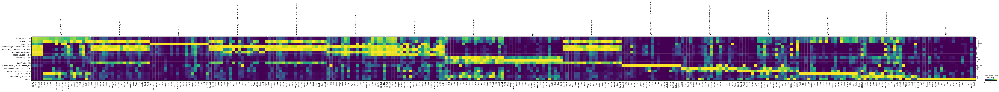

In [42]:
## automated heatmap
sc.tl.dendrogram(adata, groupby = 'cell_type')
sc.tl.rank_genes_groups(adata, groupby = 'cell_type', method = 'wilcoxon')
sc.pl.rank_genes_groups_matrixplot(adata, n_genes = 20, standard_scale = 'var', save= 'auto_marker_matrix.pdf')

In [43]:
## frequency table
xlabel = 'treatment'
cell_types_label = 'cell_type'
cols = adata.uns['%s_colors' %cell_types_label]
celltypes = adata.obs[cell_types_label].cat.categories

relFreqs = codes.calc_relFreq(adata, group_by = cell_types_label, xlabel = xlabel, condition = None)
relFreqs.head(2)

,Ly6c2- non-classical Monocytes,Ly6c2+ classical Monocytes,Ly6c2+/Cd11c+/Cd11b- Monocytes,Differentiating Monocytes,M2 Macrophages,AM,Prg4+ IM,Lyve1+/Cd163+ IM,Lyve1-/Cd163- IM,Cd103+/Clec9a+ cDC,Cd209+/Cd11b+ cDC,Fscn1+ DC,Proliferating AM,Proliferating IM,Proliferating Cd103+/Clec9a+ cDC,Proliferating Cd209+/Cd11b+ cDC,treatment
d100BLM_Combo48,0.002439,0.034959,0.000813,0.073171,0.542276,0.144715,0.012195,0.052846,0.047154,0.008943,0.027642,0.030894,0.020325,0.000000,0.000000,0.001626,BLM+Combo
d100BLM_G120528,0.035333,0.083333,0.002000,0.034667,0.308667,0.144667,0.002667,0.054667,0.122000,0.030000,0.061333,0.054000,0.060000,0.000667,0.001333,0.004667,BLM+GLPG1205


Saving Figure to /home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/mnp_subset/relfreqs_treatment.pdf


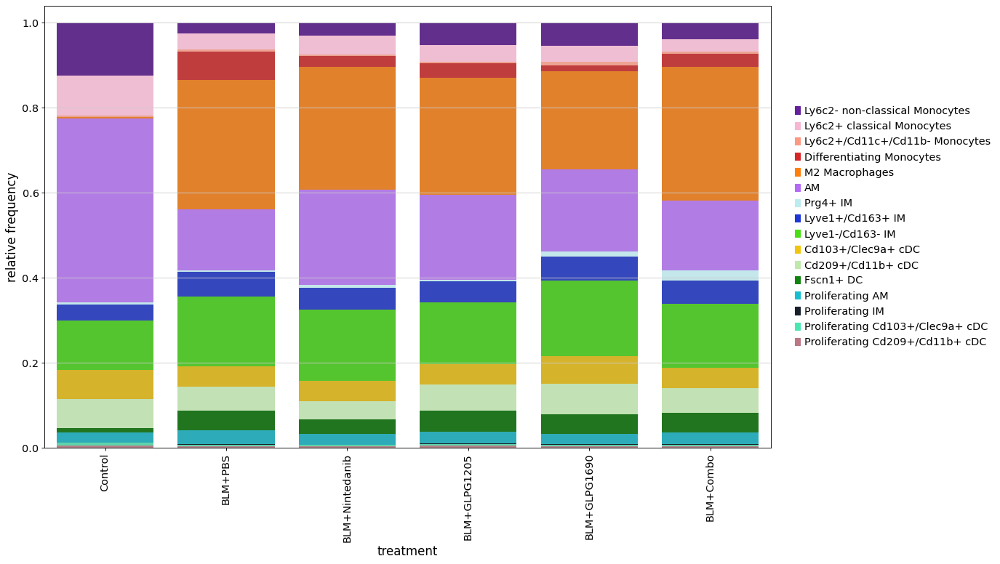

In [44]:
## cell type frequencies per treatment category
codes.plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (16,10), order = ['Control','BLM+PBS','BLM+Nintedanib','BLM+GLPG1205','BLM+GLPG1690','BLM+Combo'],
                               errbar = False, cols = cols, width = 0.8,
                               save='/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/mnp_subset/relfreqs_treatment.pdf')

In [45]:
## frequency table
xlabel = 'treatment_time'
cell_types_label = 'cell_type'
cols = adata.uns['%s_colors' %cell_types_label]
celltypes = adata.obs[cell_types_label].cat.categories

relFreqs = codes.calc_relFreq(adata, group_by = cell_types_label, xlabel = xlabel, condition = None)
relFreqs.head(2)

,Ly6c2- non-classical Monocytes,Ly6c2+ classical Monocytes,Ly6c2+/Cd11c+/Cd11b- Monocytes,Differentiating Monocytes,M2 Macrophages,AM,Prg4+ IM,Lyve1+/Cd163+ IM,Lyve1-/Cd163- IM,Cd103+/Clec9a+ cDC,Cd209+/Cd11b+ cDC,Fscn1+ DC,Proliferating AM,Proliferating IM,Proliferating Cd103+/Clec9a+ cDC,Proliferating Cd209+/Cd11b+ cDC,treatment_time
d100BLM_Combo48,0.002439,0.034959,0.000813,0.073171,0.542276,0.144715,0.012195,0.052846,0.047154,0.008943,0.027642,0.030894,0.020325,0.000000,0.000000,0.001626,BLM+Combo_d10
d100BLM_G120528,0.035333,0.083333,0.002000,0.034667,0.308667,0.144667,0.002667,0.054667,0.122000,0.030000,0.061333,0.054000,0.060000,0.000667,0.001333,0.004667,BLM+GLPG1205_d10


Saving Figure to /home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/mnp_subset/relfreqs_treatment_time.pdf


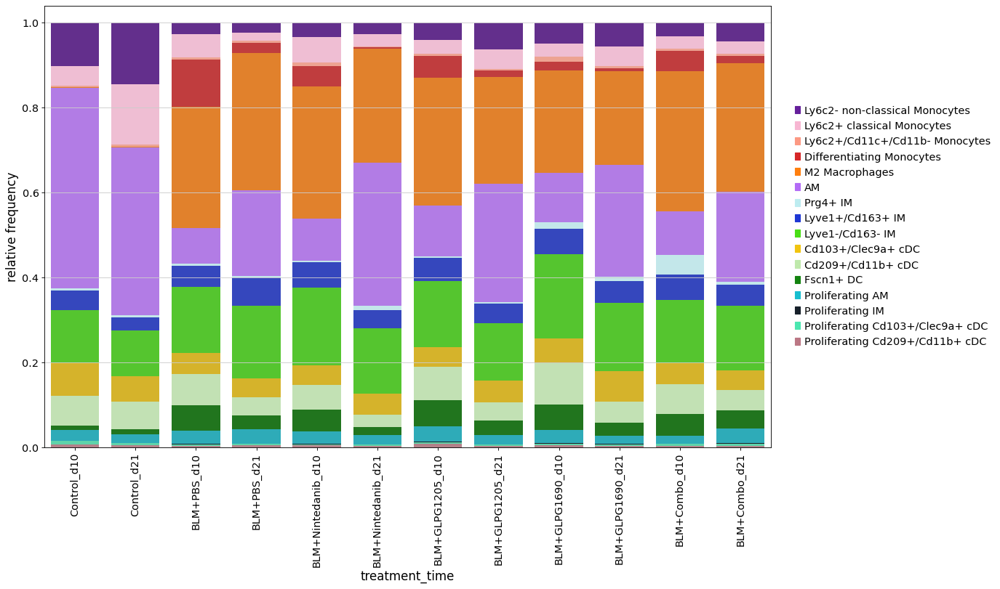

In [46]:
## cell type frequencies per treatment time category
codes.plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (16, 10),
            order = ['Control_d10','Control_d21','BLM+PBS_d10','BLM+PBS_d21','BLM+Nintedanib_d10','BLM+Nintedanib_d21',
                     'BLM+GLPG1205_d10','BLM+GLPG1205_d21','BLM+GLPG1690_d10','BLM+GLPG1690_d21','BLM+Combo_d10','BLM+Combo_d21'],
            errbar = False, cols = cols, width = 0.8, 
            save='/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/mnp_subset/relfreqs_treatment_time.pdf')

### Save annotated subset

In [47]:
## save adata object
adata.write('/mnt/platte_1/Projects/210115_GLPG/subsets/210218_mnp_subset_NIKLAS_annotated.h5ad')